# IC 4040

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

import glob
import sys, os
sys.path.append(os.path.expanduser('~/Desktop/Pangal'))

from pangal.pangal import PanGal
from pangal.region import Region
from pangal.plot import Point, Contours
from pangal.photometry_table import PhotometryTable, PhotometryCatalog

import warnings
warnings.simplefilter("ignore")



In [8]:

directory = '../DATA/Coma/IC4040/FITS_OBS/'
muse_file =  glob.glob(directory+'*muse*.fits')
spitzer_files = glob.glob(directory+'*SPITZER_*.fits')
sdss_files = glob.glob(directory+'*sdss*.fits')
wise_files = glob.glob(directory+'*WISE*.fits')
hershel_files = glob.glob(directory+'*hpacs*.fits')
twomass_files = glob.glob(directory+'*2mass*.fits')
hst_files = glob.glob(directory+'*hst*.fits')
galex_files = ['../DATA/Coma/galex_Coma_coadd-int_nuv.fits','../DATA/Coma/galex_Coma_coadd-int_fuv.fits']

files_list =  galex_files + sdss_files + spitzer_files + hershel_files + muse_file #+ wise_files
print(files_list)

['../DATA/Coma/galex_Coma_coadd-int_nuv.fits', '../DATA/Coma/galex_Coma_coadd-int_fuv.fits', '../DATA/Coma/IC4040/FITS_OBS/sdss_u.fits', '../DATA/Coma/IC4040/FITS_OBS/sdss_i.fits', '../DATA/Coma/IC4040/FITS_OBS/sdss_g.fits', '../DATA/Coma/IC4040/FITS_OBS/sdss_r.fits', '../DATA/Coma/IC4040/FITS_OBS/sdss_z.fits', '../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC_1.fits', '../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC4.fits', '../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC_2.fits', '../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC3.fits', '../DATA/Coma/IC4040/FITS_OBS/hpacs_100u.fits', '../DATA/Coma/IC4040/FITS_OBS/hpacs_160u.fits', '../DATA/Coma/IC4040/FITS_OBS/hpacs_70u.fits', '../DATA/Coma/IC4040/FITS_OBS/IC4040_muse.fits']


In [9]:
z_true =  0.025593
ra_center, dec_center = 195.157754, 28.057967
distance = 104 # Mpc


In [10]:
galaxy = PanGal(fits_files=files_list,target_coords = [ra_center,dec_center],fov=1/12,EBmV=0.0093,EBmV_err=0.0002)


Processing GALEX file:  ../DATA/Coma/galex_Coma_coadd-int_nuv.fits
Processing GALEX file:  ../DATA/Coma/galex_Coma_coadd-int_fuv.fits
Processing SDSS file:  ../DATA/Coma/IC4040/FITS_OBS/sdss_u.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Processing SDSS file:  ../DATA/Coma/IC4040/FITS_OBS/sdss_i.fits
Processing SDSS file:  ../DATA/Coma/IC4040/FITS_OBS/sdss_g.fits
Processing SDSS file:  ../DATA/Coma/IC4040/FITS_OBS/sdss_r.fits
Processing SDSS file:  ../DATA/Coma/IC4040/FITS_OBS/sdss_z.fits
Processing IRAC:  ../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC_1.fits
Processing IRAC:  ../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC4.fits
Processing IRAC:  ../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC_2.fits
Processing IRAC:  ../DATA/Coma/IC4040/FITS_OBS/SPITZER_IRAC3.fits
Processing Herschel PACS:  ../DATA/Coma/IC4040/FITS_OBS/hpacs_100u.fits
Processing Herschel PACS:  ../DATA/Coma/IC4040/FITS_OBS/hpacs_160u.fits


Set MJD-END to 56088.287280 from DATE-END'. [astropy.wcs.wcs]


Processing Herschel PACS:  ../DATA/Coma/IC4040/FITS_OBS/hpacs_70u.fits
Processing MUSE:  ../DATA/Coma/IC4040/FITS_OBS/IC4040_muse.fits


Set MJD-END to 56088.327350 from DATE-END'. [astropy.wcs.wcs]


Correcting for dust attenuation


In [7]:
galaxy.overview

Images: 

['galex_nuv', 'galex_fuv', 'sdss_u', 'sdss_i', 'sdss_g', 'sdss_r', 'sdss_z', 'spitzer_irac_1', 'spitzer_irac_4', 'spitzer_irac_2', 'spitzer_irac_3', 'herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um', 'muse_blue', 'muse_green', 'muse_red', 'muse_nir', 'muse_white_aoe', 'wise_w4', 'wise_w2', 'wise_w3', 'wise_w1']

Cubes: 

['muse']


In [17]:
galaxy.cubes.muse.line_map(line='Ha', width=10, continuum_offset_1=50, continuum_offset_2=50, z=z_true,pangal_object=galaxy);
galaxy.cubes.muse.line_map(line='Hb', width=10, continuum_offset_1=50, continuum_offset_2=50, z=z_true,pangal_object=galaxy);

In [32]:
muse_obj = galaxy.images['muse_red']

# Convert angular scale to physical scale
from astropy.cosmology import Planck18 as cosmo
z_Coma = 0.023513
D_A = cosmo.angular_diameter_distance(z_Coma).to('pc').value
theta_deg_1kpc = 1e3 / D_A / (np.pi / 180)               # Convert 1 kpc in deg
theta_arcsec_1kpc = 1e3 / D_A / (np.pi / 648000)         # Convert 1 kpc in arcsec
npix_1kpc = theta_deg_1kpc / muse_obj.dtheta_pix_deg    # number of pixels corresponding to 1 kpc

image = muse_obj.mag_arcsec2

# Define the ellipse
x_center, y_center = muse_obj.wcs.all_world2pix([[ra_center,dec_center]],1)[0] 
axis_ratio = 0.5
angle = 60

dr_pix = 3 * npix_1kpc

# Define the separator (regions must exclude Ha and Hb)
x_p, y_p = 143, 150 #145
ra_x_p, dec_y_p = muse_obj.wcs.all_pix2world([[y_p, x_p]], 1)[0]
m_semimajor_ax = np.tan(angle*np.pi/180)
m_sep_line = -1/m_semimajor_ax

y_coords, x_coords = np.meshgrid(np.linspace(0,image.shape[0], image.shape[0]),np.linspace(0, image.shape[1], image.shape[1]),indexing='ij')
exclude_Ha_mask = (y_coords > m_sep_line * (x_coords - x_p) + y_p)

# REGIONS ARE DEFINED ON MUSE

regions_for_mcspf = []
for i,r_kpc in enumerate(np.arange(4,10,2)):

    region = EllipseAnnulusPixelRegion(
        center=PixCoord(x_center, y_center),
        inner_width = 2 * r_kpc * npix_1kpc, 
        outer_width = 2 * (r_kpc+2) * npix_1kpc,  
        inner_height = axis_ratio * 2 * r_kpc * npix_1kpc,  
        outer_height = axis_ratio * 2 * (r_kpc+2) * npix_1kpc,
        angle = angle*u.deg  
    )

    mask_elliptical_annulus = region.to_mask(mode='center').to_image(image.shape).astype(bool)
    mask = np.zeros_like(image, dtype=bool)
    mask |= (mask_elliptical_annulus & exclude_Ha_mask.astype(bool))
    

    if np.any(mask):

        R = r_kpc + 1
        print(R)
        x_centroid = x_center + R * npix_1kpc * np.cos(angle*np.pi/180)
        y_centroid = m_semimajor_ax * (x_centroid - x_center) + y_center 
        ra,dec = muse_obj.wcs.all_pix2world([[x_centroid, y_centroid]], 0)[0]

        regions_for_mcspf.append(Region(mask=mask,wcs=muse_obj.wcs,caption_coords = [ra,dec],id=str(i+1)))
                


5
7
9


In [11]:
ellipses = []
for R in [5,20,1.91]:
    ellipses.append(
        Region.ellipse(
            id=f'NGC 4848: R {R} kpc',
            ra_center=ra_center, dec_center=dec_center,
            semimajor_axis=R * theta_deg_1kpc,
            axis_ratio=axis_ratio, angle=angle,
            wcs=galaxy.images['muse_red'].wcs,
            image_shape=galaxy.images['muse_red'].mag_arcsec2.shape,
            linewidth=2, linestyle=':', color='gainsboro'
        )
    )

contours = [Contours(image=galaxy.images['muse_red'].mag_arcsec2,wcs=galaxy.images['muse_red'].wcs,levels=[22,23,24,25],
                     color='navy', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.0f',label='muse_red',), #target_bands=['muse_red']
           Contours(image=galaxy.images['muse_Ha'].erg_s_cm2_arcsec2,wcs=galaxy.images['muse_Ha'].wcs,levels=[5e-18,1e-16,1e-15],
                     color='pink', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.1e',label='Ha',)] #target_bands=['muse_Ha'] 


points=[Point(coords=(ra_center,dec_center),caption='IC 4040',caption_fontsize=14,caption_offset=[0.02,0.03],color='navy',)]

NameError: name 'Region' is not defined

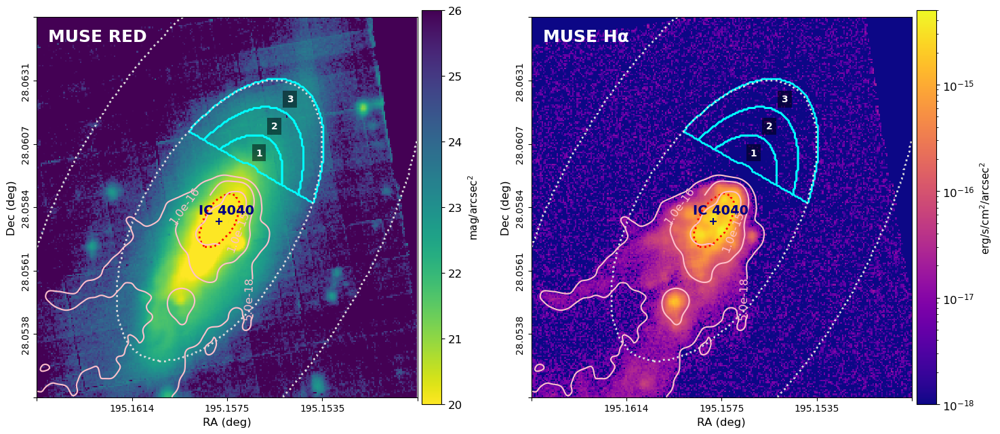

In [34]:
ellipses[-1].plot_aesthetic(color='red',linewidth=2)

galaxy.plot( plots_per_row=2,
              
              bands=['muse_red','muse_Ha'],
              figsize= (15,10),
              auto_titles=True,
              auto_title_color='white',
              auto_title_fontsize=18,
                regions=regions_for_mcspf+ellipses, 
                contours=[contours[-1]],
                points = points,
                set_scale_lims = {'muse_blue':(18,27),'muse_red':(20,26),'muse_Ha':(1e-18,5e-15)},
                set_cmaps = {'muse_blue':'nipy_spectral','muse_green':'nipy_spectral','muse_red':'viridis','muse_nir':'nipy_spectral','muse_Ha':'plasma','muse_Hb':'plasma'},
                legend=False,
                #n_yticks=3,
               show_region_captions=True,
                auto_titles_style=1,
                #interactive_pix_coords=True,
                n_xticks= 3,
                )



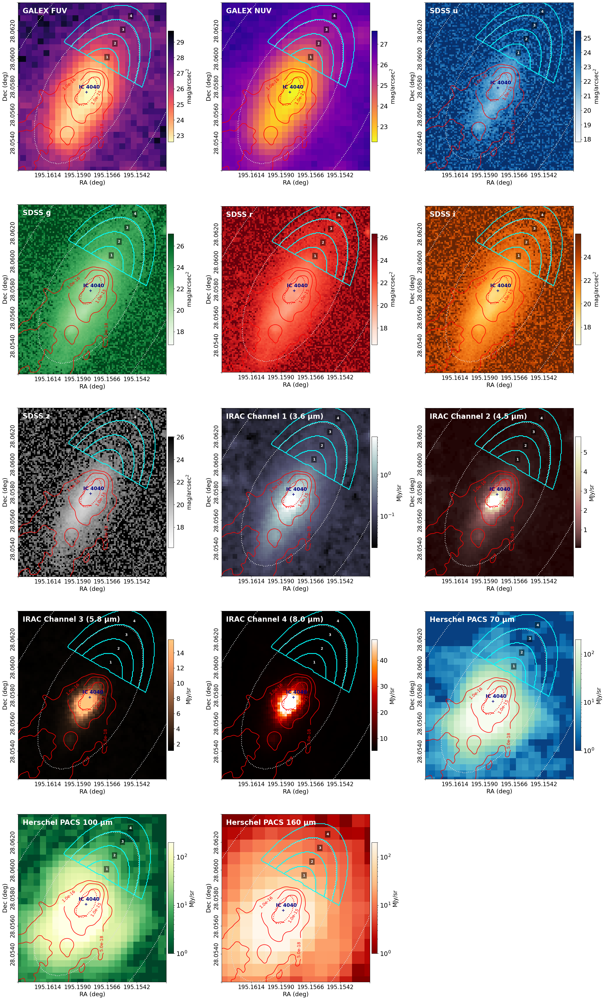

In [21]:
contours[-1].plot_aesthetic(color='red')

galaxy.plot( plots_per_row=3,
            
              bands=['galex_fuv','galex_nuv','sdss_u','sdss_g','sdss_r','sdss_i', 'sdss_z','spitzer_irac_1',
                     'spitzer_irac_2','spitzer_irac_3','spitzer_irac_4',
                     'herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
              auto_titles=True,
              auto_titles_style=1,
              auto_title_fontsize=20,
              auto_title_color='white',
              ra_min = ra_center-0.006,
              ra_max = ra_center+0.006,
              dec_min = dec_center-0.006,
              dec_max = dec_center+0.006,
              regions= regions_for_mcspf + ellipses,
              contours=[contours[-1]],
              points = points,
              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,
              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {#'galex_nuv':(22,27),
                                #'galex_fuv':(22,27),
                                #'spitzer_irac_3':(1,10),
                                #'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),
                               
                               },
              show_region_captions=True,
              legend=False
            )

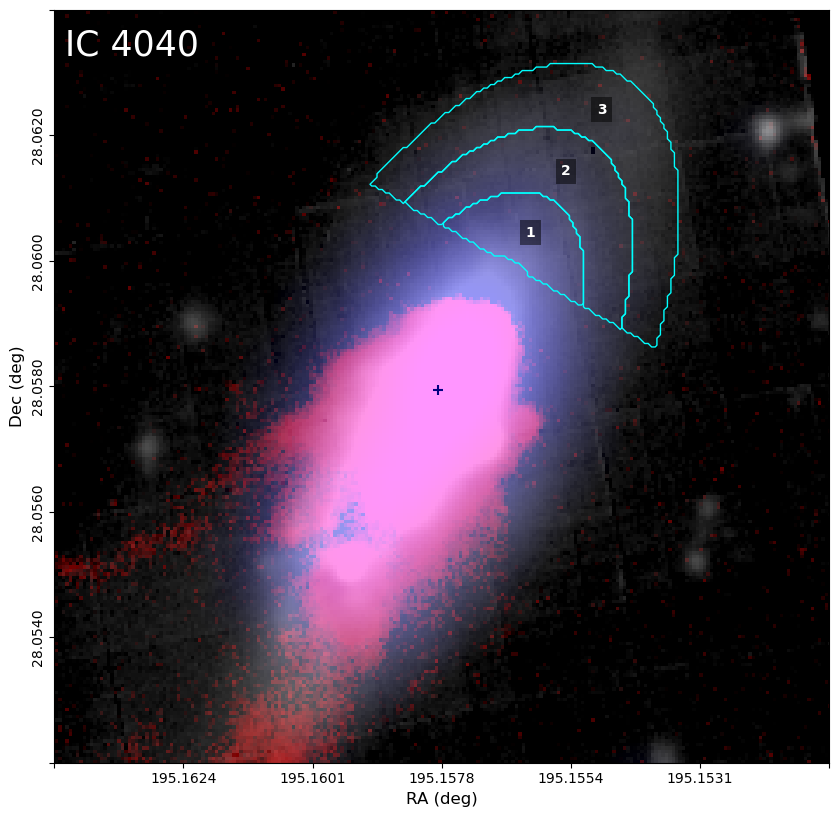

In [47]:
galaxy.make_false_color(
    bands=['muse_Ha','muse_red','galex_nuv'],
    colors={
        'muse_red': (1,1,1),  # stellar continuum in white
        'muse_Ha':  (1,0,0),              # Hα in red
        'galex_nuv':(0,0,1),              # UV in blue
    },
    scale_lims={
        'muse_red': (30,95),  # adjust as needed to show stellar disc
        'muse_Ha':  (70,90),              # tweak to highlight Hα tails
        'galex_nuv':(70,99),             # highlight star-forming regions
    },
    stretch={
        'muse_red': 'log',  # smooth stellar light
        'muse_Ha':'asinh',                  # stretch faint Hα emission
        'galex_nuv':'asinh',                # stretch faint UV
    },
    gamma=1.3
)

for i in range(3):
    regions_for_mcspf[i].plot_aesthetic(color='cyan',linewidth=1,caption_fontsize=10)

p = Point(coords=(ra_center,dec_center),caption='',caption_fontsize=12,caption_offset=[0.02,0.03],color='navy',)

galaxy.plot_false_color(
    rgb_image='rgb',
    ra_min = ra_center-0.007,
    ra_max = ra_center+0.007,
    dec_min = dec_center-0.006,
    dec_max = dec_center+0.006,
    regions=regions_for_mcspf,
    title='IC 4040',
    title_loc=(0.1,0.93),
    title_fontsize=25,
    points=[p],
)

In [57]:
bands = ['galex_nuv','galex_fuv','sdss_u', 'sdss_g','sdss_r', 'sdss_i', 'sdss_z',
         'spitzer_irac_1', 'spitzer_irac_2', 'spitzer_irac_3', 'spitzer_irac_4', 
         'herschel_pacs_70um', 'herschel_pacs_100um', 'herschel_pacs_160um']


phot_list = []
for i in range(3):
    phot = galaxy.photometry(regions_for_mcspf[i],background_exclude_regions=[ellipses[-1]],print_output=True,bands = bands)
    phot_list.append(phot)




GALEX NUV
Total flux: 0.60842, poisson unc: 0.00292, sky flux: 0.02279, sky std: 0.002574753388590229
	Flux = 0.02131 ± 0.00100 mJy, SNR = 21.21
GALEX FUV
Total flux: 0.12686, poisson unc: 0.00204, sky flux: 0.00199, sky std: 0.0004629338747284482
	Flux = 0.01439 ± 0.00071 mJy, SNR = 20.40
SDSS u
Total flux: 903.22031, poisson unc: 4.04396, sky flux: 21.64069, sky std: 48.47771262720289
	Flux = 0.04258 ± 0.00283 mJy, SNR = 15.07
SDSS g
Total flux: 8701.66953, poisson unc: 12.63972, sky flux: 89.27178, sky std: 139.65676313710185
	Flux = 0.11757 ± 0.00220 mJy, SNR = 53.42
SDSS r
Total flux: 7597.72302, poisson unc: 11.78018, sky flux: 116.83718, sky std: 198.7905512324295
	Flux = 0.14262 ± 0.00402 mJy, SNR = 35.50
SDSS i
Total flux: 6943.37516, poisson unc: 11.28264, sky flux: 81.06641, sky std: 209.04848036048938
	Flux = 0.16338 ± 0.00521 mJy, SNR = 31.38
SDSS z
Total flux: 1552.13502, poisson unc: 5.30809, sky flux: 33.24864, sky std: 105.01805464730309
	Flux = 0.18183 ± 0.01303 mJy, 

In [58]:
for i in range(3):
    for band in ['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um']:
        appo = phot_list[i].data[band]
        phot_list[i].data[band] = (0,appo[0])
    phot_list[i].to_fits(f'../DATA/Coma/IC4040/ic4040_region{i+1:.0f}_photometry.fits')

In [59]:
phot_list[0].print()

,Value,Error,SNR
galex_nuv,0.021312,0.001005,21.207448
galex_fuv,0.014392,0.000706,20.395903
sdss_u,0.042579,0.002825,15.070513
sdss_g,0.117572,0.002201,53.419661
sdss_r,0.142623,0.004018,35.495865
sdss_i,0.163383,0.005207,31.377524
sdss_z,0.181835,0.013026,13.958865
spitzer_irac_1,0.104611,0.004716,22.182388
spitzer_irac_2,0.070742,0.004136,17.102568
spitzer_irac_3,0.094956,0.020200,4.700866


In [64]:
#PhotometryTable(data=phot_list).print()

In [65]:
spectra = galaxy.cubes.muse.extract_spectra(regions=regions_for_mcspf,pangal_object=galaxy)


In [67]:
for i,spec in enumerate(spectra):
    spec.header['REDSHIFT'] = z_true
    spec.to_fits(f'../DATA/Coma/IC4040/spectra_extracted_from_MUSE/muse_spectrum_region_{i+1:.0f}.spec')
    

In [13]:
print(spectra_mcspf)

[Spectrum(wl=array([4750.  , 4751.25, 4752.5 , ..., 8996.25, 8997.5 , 8998.75]), resolution=array([1638.02746875, 1638.65680505, 1639.28619796, ..., 3500.35983698,
       3500.64948137, 3500.93886908]), flux=array([1.9607214e-19, 1.7948192e-19, 2.1125514e-19, ..., 6.9926456e-20,
       6.7627069e-20, 7.2614225e-20], dtype=float32), flux_err=array([6.76287515e-21, 4.66423439e-21, 4.44721164e-21, ...,
       1.56608135e-21, 1.65577715e-21, 2.54966117e-21]), header=, id=None), Spectrum(wl=array([4750.  , 4751.25, 4752.5 , ..., 8996.25, 8997.5 , 8998.75]), resolution=array([1638.02746875, 1638.65680505, 1639.28619796, ..., 3500.35983698,
       3500.64948137, 3500.93886908]), flux=array([9.06005949e-20, 8.49989084e-20, 1.03951154e-19, ...,
       3.26533036e-20, 3.11741399e-20, 3.45593313e-20], dtype=float32), flux_err=array([4.34658316e-21, 3.04125700e-21, 2.81854687e-21, ...,
       9.98910871e-22, 1.07615833e-21, 1.69889992e-21]), header=, id=None), Spectrum(wl=array([4750.  , 4751.25, 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

import glob
import sys, os
sys.path.append(os.path.expanduser('~/Desktop/Pangal'))

#from pangal.pfitter import PFitter
from pangal.photometry_table import PhotometryTable

from pangal.pfitter import PFitter
from pangal.run import Run
#from build_boissier import load_spectrum_models_from_fits

import warnings
warnings.simplefilter("ignore")

In [5]:
phot = []
for i in range(3):
    phot.append(PhotometryTable().from_fits(f'../DATA/Coma/IC4040/ic4040_region{i+1:.0f}_photometry.fits'))

phot[0].print()

,Value,Error,SNR
galex_nuv,0.021312,0.001005,21.207448
galex_fuv,0.014392,0.000706,20.395903
sdss_u,0.042579,0.002825,15.070513
sdss_g,0.117572,0.002201,53.419661
sdss_r,0.142623,0.004018,35.495865
sdss_i,0.163383,0.005207,31.377524
sdss_z,0.181835,0.013026,13.958865
spitzer_irac_1,0.104611,0.004716,22.182388
spitzer_irac_2,0.070742,0.004136,17.102568
spitzer_irac_3,0.094956,0.020200,4.700866


In [7]:
from pangal.spectrum import Spectrum
spectra = []
for i in range(3):
    spectra.append(Spectrum().from_fits(f'../DATA/Coma/IC4040/spectra_extracted_from_MUSE/muse_spectrum_region_{i+1:.0f}.spec'))

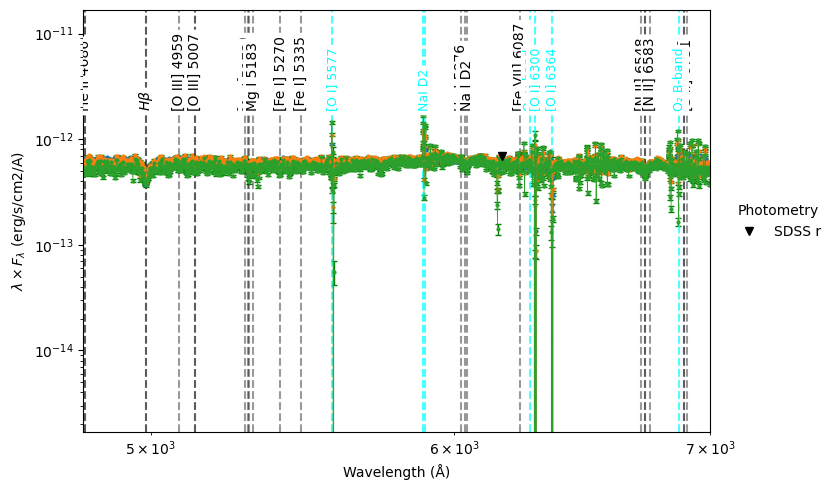

In [8]:
Spectrum().plot(figsize=(10,5),spectra=spectra, per_wavelength=True, phot=phot[0], #show_phot_legend=True,
              winf=4800,wsup=7000, 
                #ymin=5e-13, ymax= 1.5e-11, 
                #y_units='mJy',
                show_all_spectral_lines=True,show_top_spectral_lines=True,
                show_atmospheric_lines=True,show_spec_legend=False)


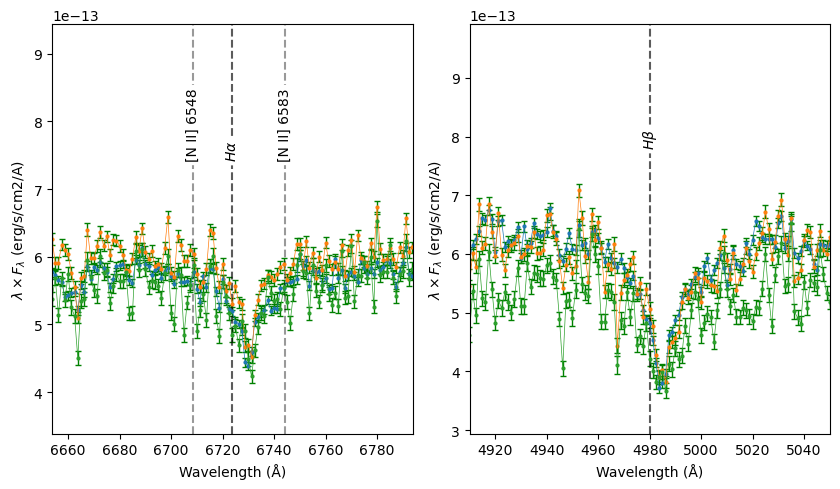

In [9]:
Spectrum().plot(figsize=(10,5),
                spectra=spectra, 
                per_wavelength=True, 
                phot=phot[0], #show_phot_legend=True,
                winf=4800,wsup=7000, 
                zoom_on_line=['Ha','Hb'],
                redshift = 0.0245, 
                #ymin=5e-13, ymax= 1.5e-11, 
                #y_units='mJy',
                show_all_spectral_lines=True,show_top_spectral_lines=True,
                show_atmospheric_lines=True,show_spec_legend=False) 

# Region 1

In [10]:
custom_prior = {
    'av':     {'type':'uniform', 'low':0.0,    'high':0.2},
    #'alpha':  {'type':'uniform', 'low':1.5,    'high':3},
    'm_star':  {'type':'uniform', 'low':8.2,    'high':9.5},
    'sigma_vel': {'type':'uniform', 'low':0,    'high':400},
    'vel_sys': {'type':'uniform', 'low':-500,    'high':+500},
    'TAU_Q': {'type':'uniform', 'low':10,    'high':500},
}

bands = ['galex_nuv','galex_fuv','sdss_u', 'sdss_g','sdss_r', 'sdss_i', 'sdss_z',
         #'hst_wfc3_uvis_f350lp','hst_wfc3_uvis_f600lp',
         'spitzer_irac_1', 'spitzer_irac_2', 'spitzer_irac_3', 'spitzer_irac_4', 
         'herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um']

In [ ]:
fitter = PFitter(model_file='new_models/V_160_R_8.fit',
             model_pars=['Q_AGE','TAU_Q','BURST','METAL'],
             uv_bump = False,
             leitatt = False,
            )

In [20]:
for i in range(4):
    for band in ['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um']:
        old_tuple = phot_list[i].data[band]
        new_tuple = (np.float64(0), old_tuple[0])
        phot_list[i].data[band] = new_tuple

In [ ]:
print(spectra_mcspf)
w = spectra_mcspf[0].wl
mask_atmospheric_lines = (
    ((w >= 5565) & (w <= 5585)) |
    ((w >= 5880) & (w <= 5910)) |
    ((w >= 6275) & (w <= 6375)) |
    ((w >= 6860) & (w <= 6890))
)
        
for spec in spectra_mcspf:
    spec.flux[mask_atmospheric_lines] = 0
    #spec.flux_err[mask_atmospheric_lines] = 0

In [26]:
nrows = len(regions_for_mcspf)

ID = [i + 1 for i in range(nrows)]
z_best = [z_true for _ in range(nrows)]
dl = [distance for _ in range(nrows)]
polymax = [7 for _ in range(nrows)]
spec_lim = ['4000,7000' for _ in range(nrows)]
res_file = ['Extracted_resolution.fits' for _ in range(nrows)]

columns = []
columns.append(fits.Column(name='id', format='K', array=np.array(ID, dtype='int64')))
columns.append(fits.Column(name='z_best', format='D', array=np.array(z_best)))
columns.append(fits.Column(name='dl', format='D', array=np.array(dl)))
columns.append(fits.Column(name='polymax', format='J', array=np.array(polymax, dtype='int32')))
columns.append(fits.Column(name='spec_file', format='93A', array=[''] * nrows))  # Optional if not used
columns.append(fits.Column(name='spec_lim', format='9A', array=np.array(spec_lim)))
columns.append(fits.Column(name='res_file', format='72A', array=np.array(res_file)))

for band in phot_list[0].data.keys():
    columns.append(fits.Column(name='f_' + band, format='D', array=np.zeros(nrows)))
    columns.append(fits.Column(name='e_' + band, format='D', array=np.zeros(nrows)))

# Create the HDU
coldefs = fits.ColDefs(columns)
hdu = fits.BinTableHDU.from_columns(coldefs)

# Fill in photometry
for i in range(nrows):
    for band in phot_list[i].data.keys():
        hdu.data[i]['f_' + band] = phot_list[i].data[band][0]
        hdu.data[i]['e_' + band] = phot_list[i].data[band][1]

spec_filepath = '../DATA/Coma/IC4040/'
for i,spec in enumerate(spectra_mcspf):
    w = spec.wl
    flux = spec.flux
    err = spec.flux_err

    # Create the fits file:
    primary_hdu = fits.PrimaryHDU(flux/1e-20)
    hdu_error = fits.ImageHDU(err/1e-20)
    hdu_wavelength = fits.ImageHDU(w)
    # Combine into HDUList
    hdul = fits.HDUList([primary_hdu, hdu_error, hdu_wavelength])

    # Write to file
    output_file = '../DATA/Coma/IC4040/MUSE_spec_region_'+str(i)+'.fits'
    hdul.writeto(output_file, overwrite=True)

    hdu.data[i]['spec_file'] = 'MUSE_spec_region_'+str(i)+'.fits'


print(hdu.data[1])


# Assume your BinTableHDU is called `bintable_hdu`
primary_hdu = fits.PrimaryHDU()  # Empty primary header
hdul = fits.HDUList([primary_hdu, hdu])

hdul.writeto('../DATA/Coma/IC4040/phot_spec_file_mcspf.fits', overwrite=True)



(2, 0.025593, 104.0, 7, 'MUSE_spec_region_1.fits', '4000,7000', 'Extracted_resolution.fits', 0.010606318530350958, 0.0005436702268284031, 0.01885099926792337, 0.0008996948536785791, 0.029432058542093173, 0.004287533440766589, 0.09971152181236459, 0.0033837000736860034, 0.12902001295984622, 0.007971424403306263, 0.1438772021530388, 0.0089684071994226, 0.15639250439179475, 0.025904369137122605, 0.1043672339373536, 0.009726318939759337, 0.06712386017507146, 0.008137252621186608, 0.09992871201930428, 0.03395248514903208, 0.2867728385915121, 0.028752451226420922, 8.95801562450411, 0.902187011898577, 21.85587230277774, 0.8364103373681313, 45.3378979321596, 0.9044195439178033)


### PHOTOMETRY, BAND: galex_fuv ###
Units of output:  mJy
Mask number of pixels:  21
Mask weighted number of pixels:  10.890625
Detected flux: 0.14332787646708312 counts/s
Poissonian Error 0.002186848521067105 counts/s
Background: 0.0022512407351298496 counts/s
Background std: 0.00043339380644384493 counts/s
Sky subtracted flux: 0.14107663573195325 counts/s
Total Error 0.0022293803277048246 counts/s
ZP 18.745789841746152 ± 0.05002546303923175
Flux in AB magnitudes = 20.8722  ± 0.0529
### Final value ### 
 Flux = 0.01626 ± 0.00079 mJy, SNR = 20.53




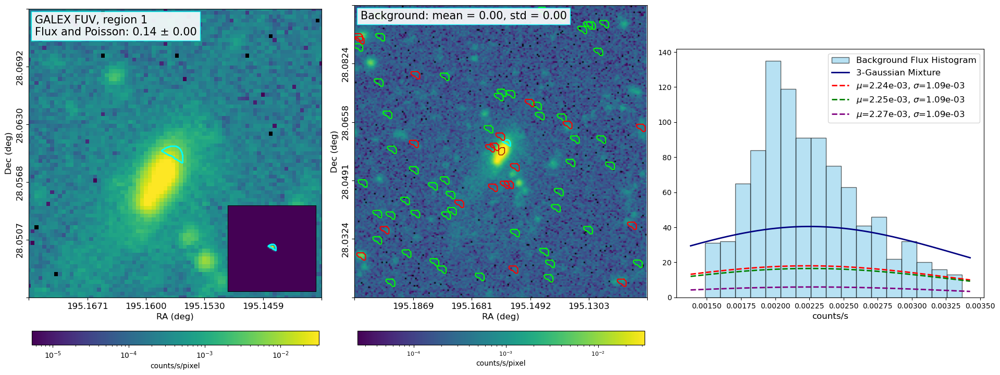

### PHOTOMETRY, BAND: galex_nuv ###
Units of output:  mJy
Mask number of pixels:  21
Mask weighted number of pixels:  10.890625
Detected flux: 0.687829922651872 counts/s
Poissonian Error 0.0031687706637949765 counts/s
Background: 0.025887488213245886 counts/s
Background std: 0.002121740487736516 counts/s
Sky subtracted flux: 0.6619424344386261 counts/s
Total Error 0.00381351415587094 counts/s
ZP 19.99751428005733 ± 0.05003145683606307
Flux in AB magnitudes = 20.4455  ± 0.0512
### Final value ### 
 Flux = 0.02409 ± 0.00114 mJy, SNR = 21.21




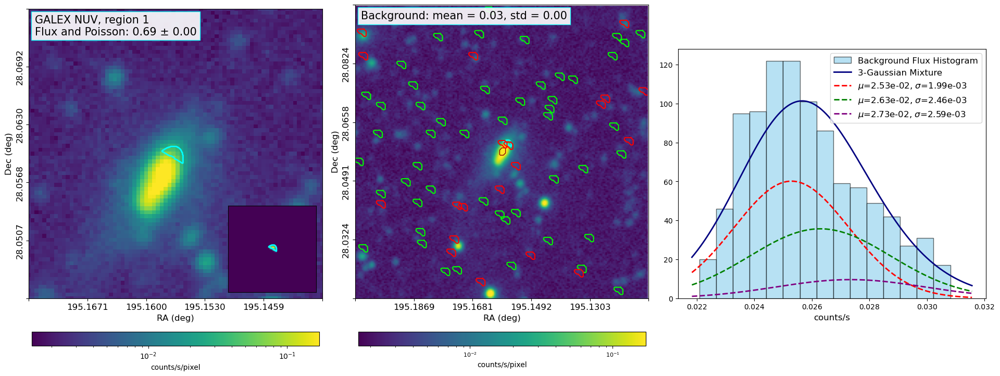

### PHOTOMETRY, BAND: sdss_u ###
Units of output:  mJy
Mask number of pixels:  200
Mask weighted number of pixels:  174.25
Detected flux: 900.4138500653207 counts/s
Poissonian Error 4.086924970082771 counts/s
Background: 24.12039988123998 counts/s
Background std: 53.596798960222074 counts/s
Sky subtracted flux: 876.2934501840807 counts/s
Total Error 53.75239356990112 counts/s
ZP 27.190162662381656 ± 0.04001130907364943
Flux in AB magnitudes = 19.8335  ± 0.0777
### Final value ### 
 Flux = 0.04232 ± 0.00303 mJy, SNR = 13.97




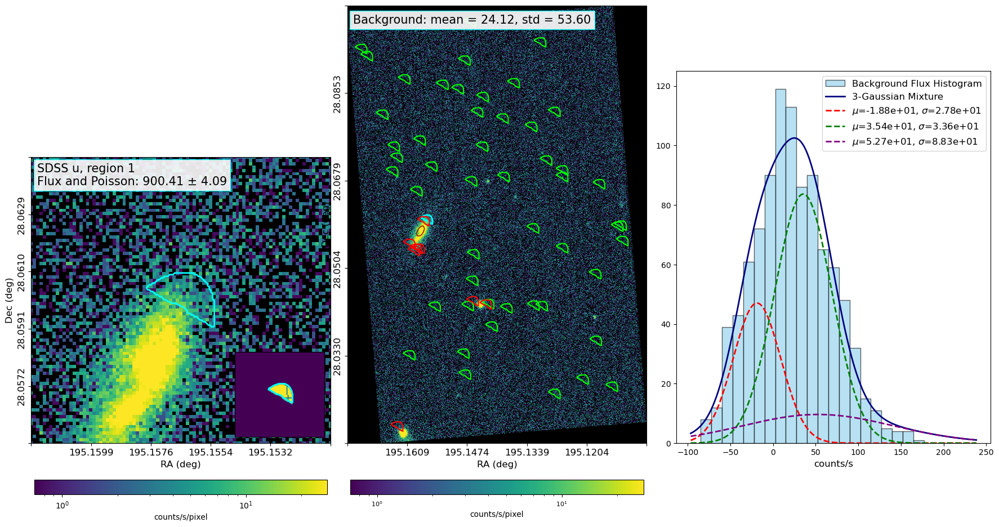

### PHOTOMETRY, BAND: sdss_g ###
Units of output:  mJy
Mask number of pixels:  200
Mask weighted number of pixels:  174.25
Detected flux: 8760.725697994232 counts/s
Poissonian Error 12.748104731856351 counts/s
Background: 74.03059858789295 counts/s
Background std: 121.27701716550055 counts/s
Sky subtracted flux: 8686.695099406339 counts/s
Total Error 121.94518878092524 counts/s
ZP 28.562053312697806 ± 0.01002891527141622
Flux in AB magnitudes = 18.7149  ± 0.0182
### Final value ### 
 Flux = 0.11859 ± 0.00199 mJy, SNR = 59.51




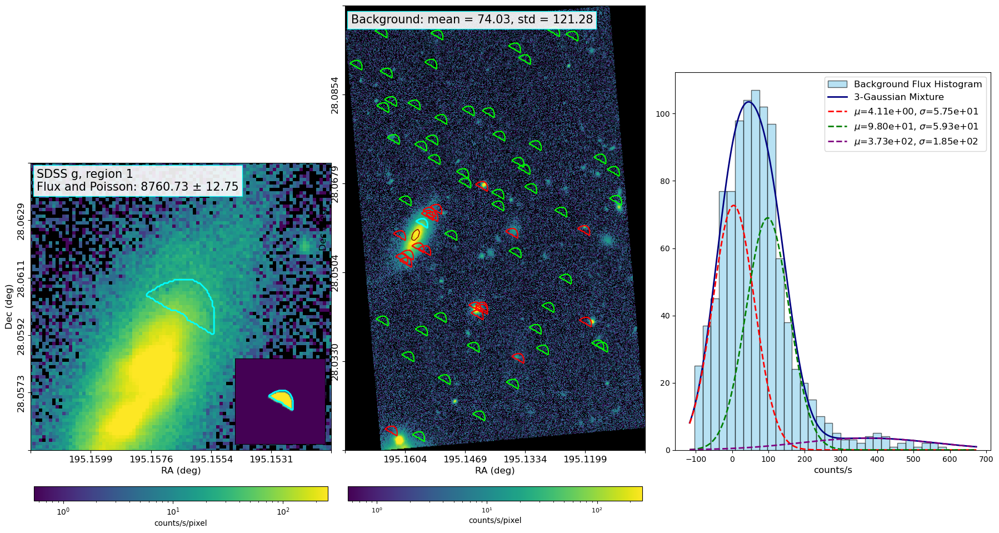

### PHOTOMETRY, BAND: sdss_r ###
Units of output:  mJy
Mask number of pixels:  191
Mask weighted number of pixels:  174.25
Detected flux: 7596.168204784393 counts/s
Poissonian Error 11.870605383761042 counts/s
Background: 97.34024616025202 counts/s
Background std: 147.87350685380437 counts/s
Sky subtracted flux: 7498.8279586241415 counts/s
Total Error 148.34920054189408 counts/s
ZP 28.199406996015476 ± 0.010013956734771089
Flux in AB magnitudes = 18.5119  ± 0.0237
### Final value ### 
 Flux = 0.14297 ± 0.00312 mJy, SNR = 45.81




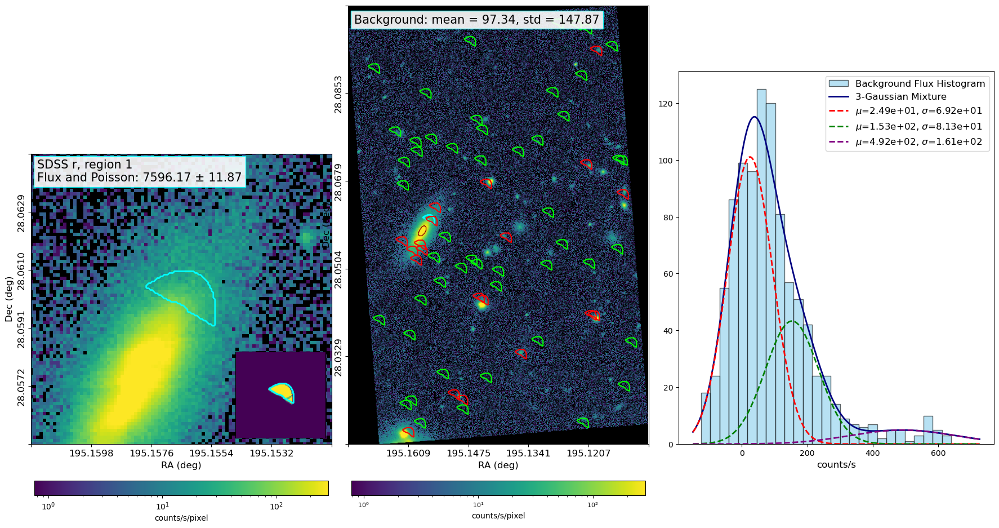

### PHOTOMETRY, BAND: sdss_i ###
Units of output:  mJy
Mask number of pixels:  195
Mask weighted number of pixels:  174.25
Detected flux: 6943.863855600357 counts/s
Poissonian Error 11.34948565039936 counts/s
Background: 63.6368903145399 counts/s
Background std: 182.7044552847535 counts/s
Sky subtracted flux: 6880.226965285817 counts/s
Total Error 183.05662731905423 counts/s
ZP 27.958159287274388 ± 0.010008722005777132
Flux in AB magnitudes = 18.3642  ± 0.0306
### Final value ### 
 Flux = 0.16381 ± 0.00461 mJy, SNR = 35.51




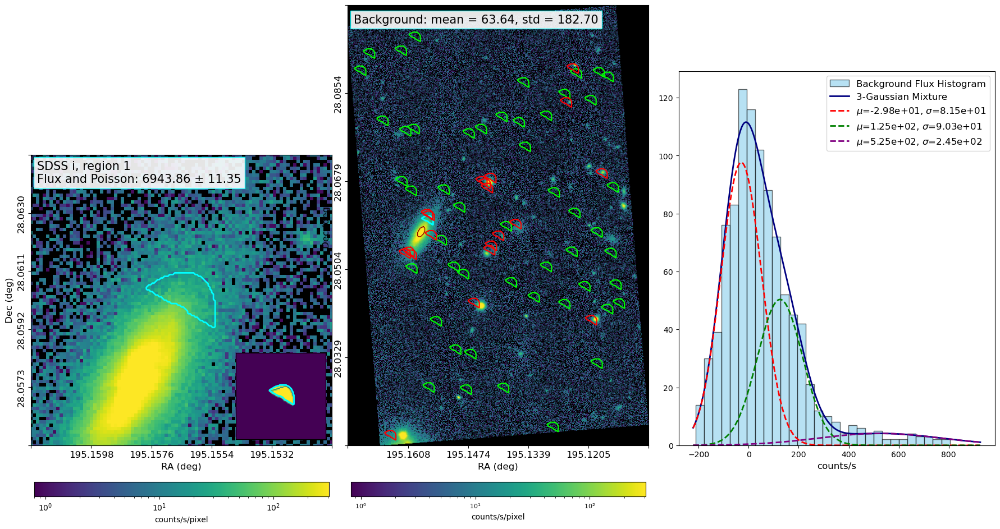

### PHOTOMETRY, BAND: sdss_z ###
Units of output:  mJy
Mask number of pixels:  187
Mask weighted number of pixels:  174.25
Detected flux: 1568.3651898354292 counts/s
Poissonian Error 5.393853898609322 counts/s
Background: 33.02553609804809 counts/s
Background std: 100.84933283244548 counts/s
Sky subtracted flux: 1535.339653737381 counts/s
Total Error 100.99347301993782 counts/s
ZP 26.204621993746784 ± 0.02000223928626106
Flux in AB magnitudes = 18.2391  ± 0.0742
### Final value ### 
 Flux = 0.18380 ± 0.01256 mJy, SNR = 14.64




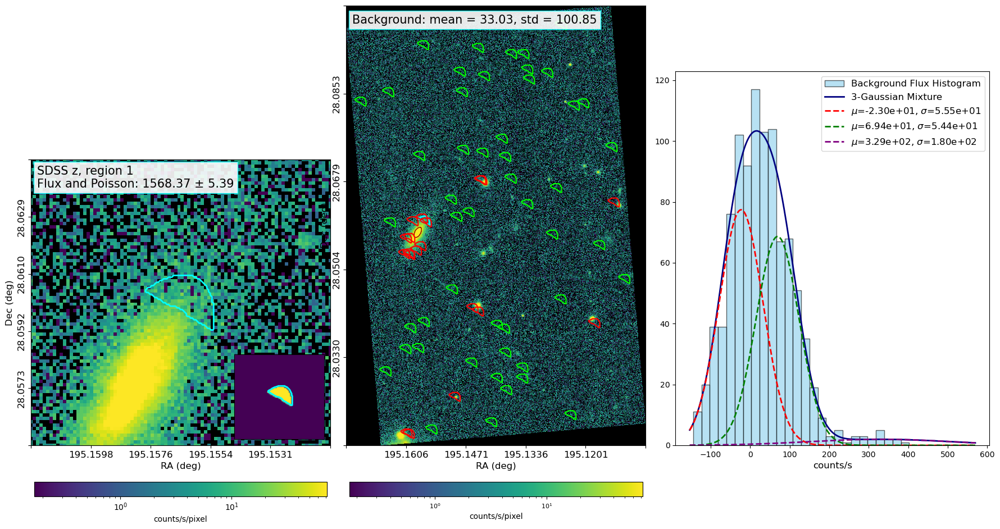

### PHOTOMETRY, BAND: spitzer_irac_1 ###
Units of output:  mJy
Mask number of pixels:  94
Mask weighted number of pixels:  77.44444444444444
Detected flux: 486.2287225458357 counts/s
Poissonian Error 4.539043067903319 counts/s
Background: 111.75240833578987 counts/s
Background std: 12.116147244042716 counts/s
Sky subtracted flux: 374.4763142100458 counts/s
Total Error 12.938467297620885 counts/s
ZP 25.25353268320692 ± 0.011
Flux in AB magnitudes = 18.8200  ± 0.0391
### Final value ### 
 Flux = 0.10765 ± 0.00388 mJy, SNR = 27.77




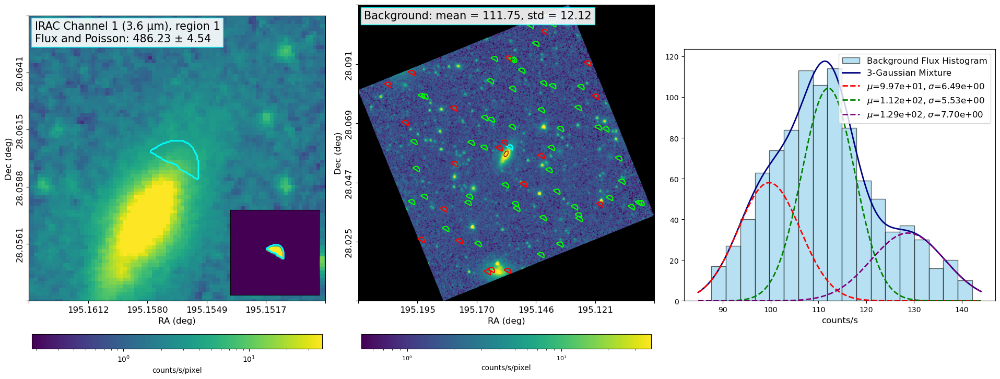

### PHOTOMETRY, BAND: spitzer_irac_2 ###
Units of output:  mJy
Mask number of pixels:  94
Mask weighted number of pixels:  77.44444444444444
Detected flux: 419.8462931050194 counts/s
Poissonian Error 3.958017996313624 counts/s
Background: 199.80300558543868 counts/s
Background std: 9.584202901210627 counts/s
Sky subtracted flux: 220.04328751958073 counts/s
Total Error 10.369322625452288 counts/s
ZP 25.103630013494346 ± 0.011
Flux in AB magnitudes = 19.2474  ± 0.0523
### Final value ### 
 Flux = 0.07262 ± 0.00350 mJy, SNR = 20.75




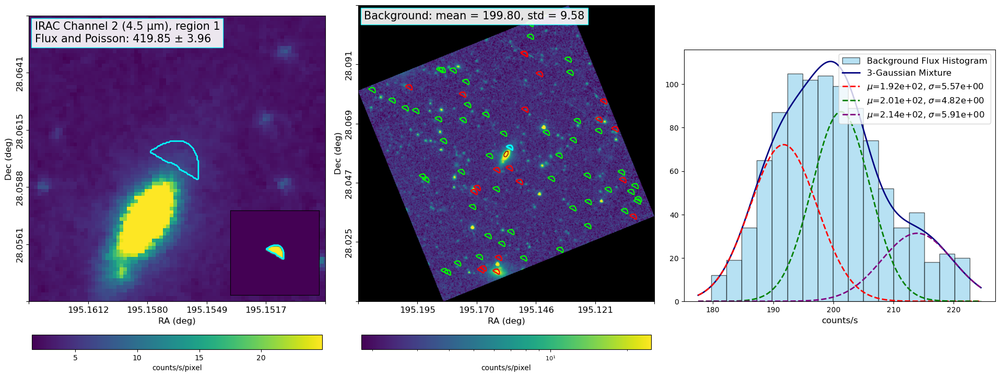

### PHOTOMETRY, BAND: spitzer_irac_3 ###
Units of output:  mJy
Mask number of pixels:  93
Mask weighted number of pixels:  77.44444444444443
Detected flux: 728.7761144638062 counts/s
Poissonian Error 5.214704075917995 counts/s
Background: 652.4625641390483 counts/s
Background std: 13.445141047889562 counts/s
Sky subtracted flux: 76.3135503247579 counts/s
Total Error 14.420990132339755 counts/s
ZP 23.6114521404324 ± 0.011
Flux in AB magnitudes = 18.9049  ± 0.2055
### Final value ### 
 Flux = 0.09955 ± 0.01884 mJy, SNR = 5.28




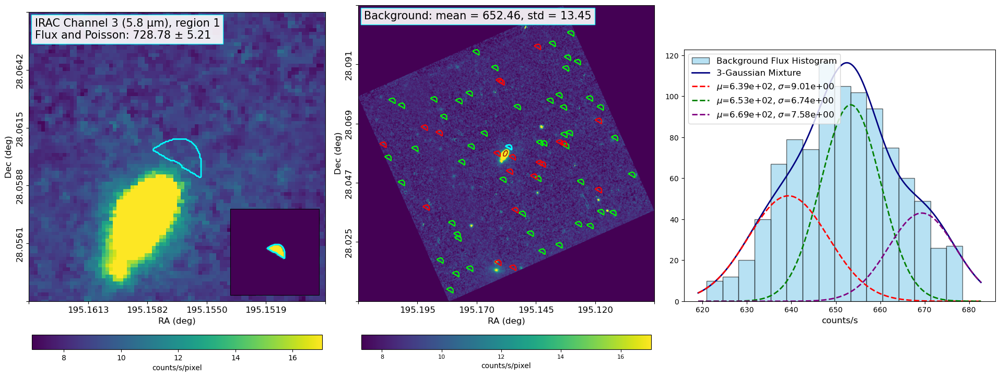

### PHOTOMETRY, BAND: spitzer_irac_4 ###
Units of output:  mJy
Mask number of pixels:  93
Mask weighted number of pixels:  77.44444444444443
Detected flux: 8585.509554545084 counts/s
Poissonian Error 17.898458987432875 counts/s
Background: 8010.315181104025 counts/s
Background std: 35.48927377064102 counts/s
Sky subtracted flux: 575.1943734410588 counts/s
Total Error 39.74724376472317 counts/s
ZP 24.7642269562357 ± 0.011
Flux in AB magnitudes = 17.8647  ± 0.0758
### Final value ### 
 Flux = 0.25949 ± 0.01812 mJy, SNR = 14.32




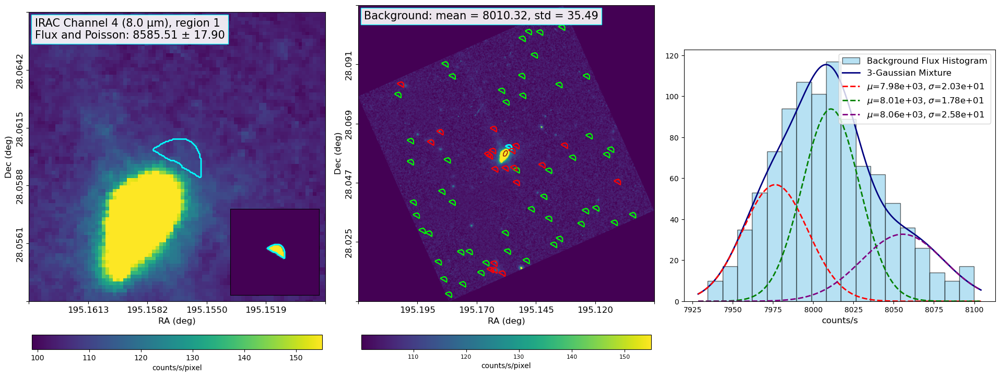

### PHOTOMETRY, BAND: herschel_pacs_70um ###
Units of output:  mJy
Mask number of pixels:  19
Mask weighted number of pixels:  10.890625
Detected flux: 0.011194983288298462 mJy
Poissonian Error 0 mJy
Background: 0.00012488054685933788 mJy
Background std: 0.0004918397054666934 mJy
Sky subtracted flux: 0.011070102741439124 mJy
Total Error 0.0004918397054666934 mJy
ZP 8.9 ± 0
Flux in AB magnitudes = 13.7896  ± 0.0482
### Final value ### 
 Flux = 11.07010 ± 0.49184 mJy, SNR = 22.51




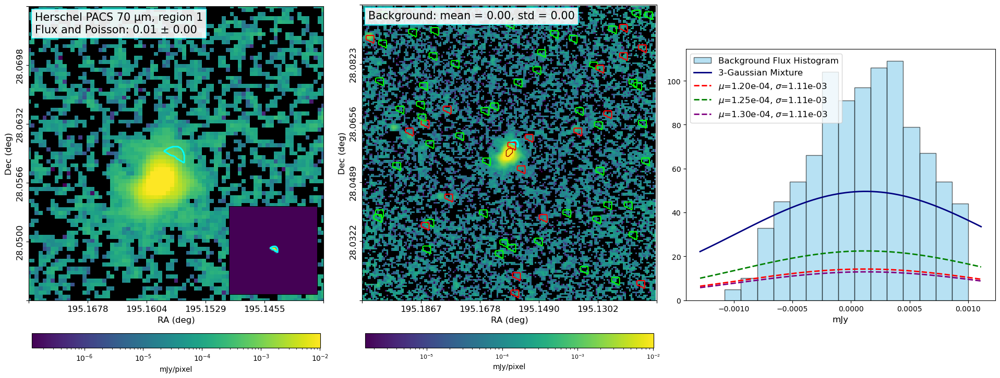

### PHOTOMETRY, BAND: herschel_pacs_100um ###
Units of output:  mJy
Mask number of pixels:  18
Mask weighted number of pixels:  10.890625
Detected flux: 0.022236600581363505 mJy
Poissonian Error 0 mJy
Background: 9.057443731991324e-05 mJy
Background std: 0.0005039792967089989 mJy
Sky subtracted flux: 0.022146026144043592 mJy
Total Error 0.0005039792967089989 mJy
ZP 8.9 ± 0
Flux in AB magnitudes = 13.0368  ± 0.0247
### Final value ### 
 Flux = 22.14603 ± 0.50398 mJy, SNR = 43.94




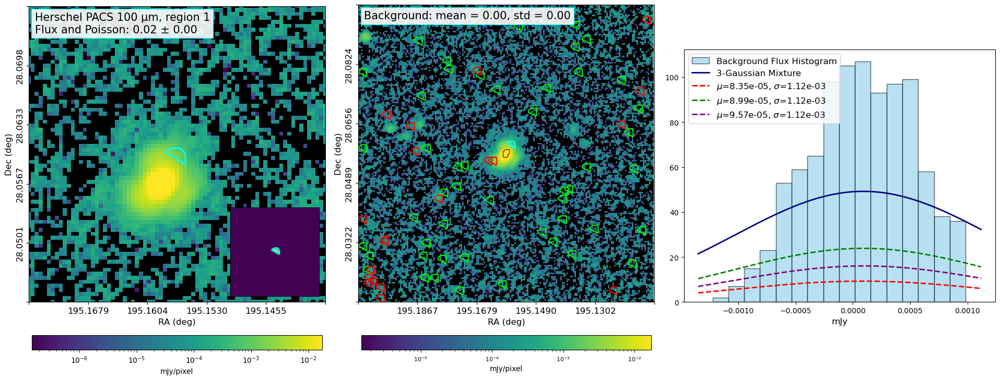

### PHOTOMETRY, BAND: herschel_pacs_160um ###
Units of output:  mJy
Mask number of pixels:  8
Mask weighted number of pixels:  2.810483870967742
Detected flux: 0.04334569383575723 mJy
Poissonian Error 0 mJy
Background: -4.878806733983795e-05 mJy
Background std: 0.0004712351078845591 mJy
Sky subtracted flux: 0.04339448190309707 mJy
Total Error 0.0004712351078845591 mJy
ZP 8.9 ± 0
Flux in AB magnitudes = 12.3064  ± 0.0118
### Final value ### 
 Flux = 43.39448 ± 0.47124 mJy, SNR = 92.09




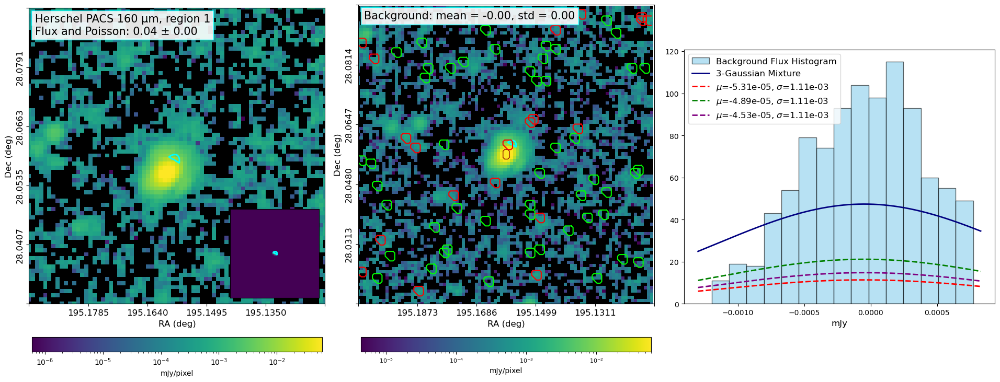

In [25]:
for b in bands:
    galaxy.inspect_photometry(band=b,
                       region=regions_for_mcspf[0],
                       background_exclude_regions=[ellipses[-1]],
                       threshold_quantile=0.8,
                       n_background_regions=1000,
                      region_plot_cmap='viridis',
                      background_plot_cmap='viridis',
                      bad_pixel_color='balck',
                      
                    )   
    

In [11]:
# 70 µm (blue band): Approximately 5.4″. 100 µm (green band): Approximately 6.1″. 160 µm (red band): Approximately 9.9″

psf_pacs = []
for res_arcsec,color,target in zip([5.4,6.1,9.9],['blue','green','darkred'],['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um']):
    res_deg = res_arcsec / 3600

    psf_pacs.append(Region(sky_region='Circle',wcs=galaxy.images.muse_red.wcs,image_shape=galaxy.images.muse_red.image.shape,
                     ra_center=ra_center,dec_center=dec_center,radius=res_deg,color=color,linewidth=5,target_bands=[target]))
    

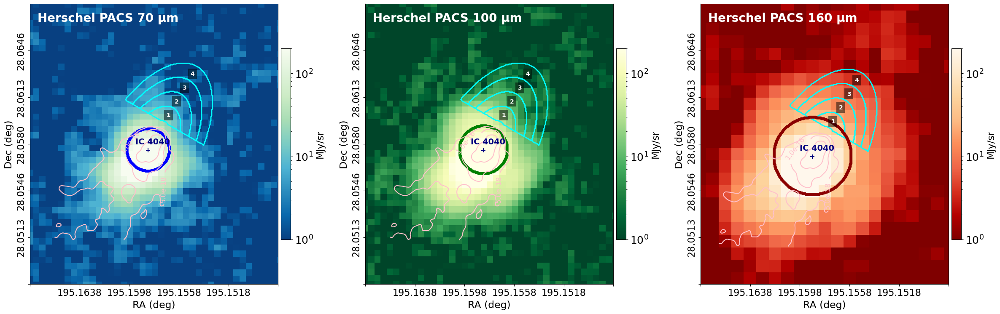

In [12]:
galaxy.plot( plots_per_row=3,
            
              bands=['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
              #figsize= (10,5),
              auto_titles=True,
              auto_titles_style=1,
              auto_title_fontsize=20,
              auto_title_color='white',
              ra_min = ra_center-0.01,
              ra_max = ra_center+0.01,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.01,
              regions= regions_for_mcspf + psf_pacs,
              contours=[contours[1]],
              points = points,
              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,
              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {#'galex_nuv':(22,27),
                                #'galex_fuv':(22,27),
                                'spitzer_irac_3':(1,10),
                                'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),
                               
                               },
              show_region_captions=True,
              legend=False
            )



In [ ]:
import pandas as pd
from pangal.filters import nice_filter_names

band_names_latex_table = {
    'galex_nuv':'NUV',
    'galex_fuv':'FUV',
    'sdss_u':'u',
    'sdss_g':'g',
    'sdss_r':'r',
    'sdss_i':'i',
    'sdss_z':'z',
    'spitzer_irac_1':'IRAC 1',
    'spitzer_irac_2':'IRAC 2',
    'spitzer_irac_3':'IRAC 3',
    'spitzer_irac_4':'IRAC 4', 
    'herschel_pacs_70um':'PACS 70 μm',
    'herschel_pacs_100um':'PACS 100 μm',
    'herschel_pacs_160um':'PACS 160 μm',   
}

rows = []
for i, region in enumerate(regions_for_mcspf):
    row = {"Region": f"Region {region.id}"}
    for b in bands:
        flux, err = phot_list[i].data[b]  # phot_list[i][b] = (value, error)
        snr = flux / err if err != 0 else float("nan")
        row[band_names_latex_table[b]] = f"{flux:.3f} ± {err:.3f} ({snr:.1f})"
    rows.append(row)

df = pd.DataFrame(rows)

# Transpose so regions become columns, bands are rows
df_T = df.set_index("Region").T

# Reset index so band names are a proper column
df_T = df_T.reset_index().rename(columns={"index": "Band"})

# Export to LaTeX (with vertical bars between all cells)
latex_code = df_T.to_latex(
    index=False,
    escape=False,
    column_format="|" + "c|" * df_T.shape[1]  # |c|c|c|...|
)

# Insert \hline after every row (pandas only adds top/bottom by default)
latex_code = latex_code.replace("\\\\\n", "\\\\ \\hline\n")

print(latex_code)